# Fine-tuning **Mask R-CNN** on custom dataset

The [source](https://haochen23.github.io/2020/06/fine-tune-mask-rcnn-pytorch.html?fbclid=IwAR0-_LhluMyeQxeGxktkpnkDaNUyOIqU-TmKijkEuSVRflONNtLD2IQN6RA#.Yk_sQ8hByHu) of the article I used.

Training [dataset](https://www.cis.upenn.edu/~jshi/ped_html/) consists of **170** images about **345** instances of pedestrians.


Mask R-CNN is a state of the art model for instance segmentation, developed on top of Faster R-CNN. Faster R-CNN is a region-based convolutional neural networks [2], that returns bounding boxes for each object and its class label with a confidence score.

# Faster R-CNN

**Stage1:** The first stage consists of two networks, backbone (ResNet, VGG, Inception, etc..) and region proposal network. These networks run once per image to give a set of region proposals. Region proposals are regions in the feature map which contain the object.

**Stage2:** In the second stage, the network predicts bounding boxes and object class for each of the proposed region obtained in stage1. Each proposed region can be of different size whereas fully connected layers in the networks always require fixed size vector to make predictions. Size of these proposed regions is fixed by using either RoI pool (which is very similar to MaxPooling) or RoIAlign method.

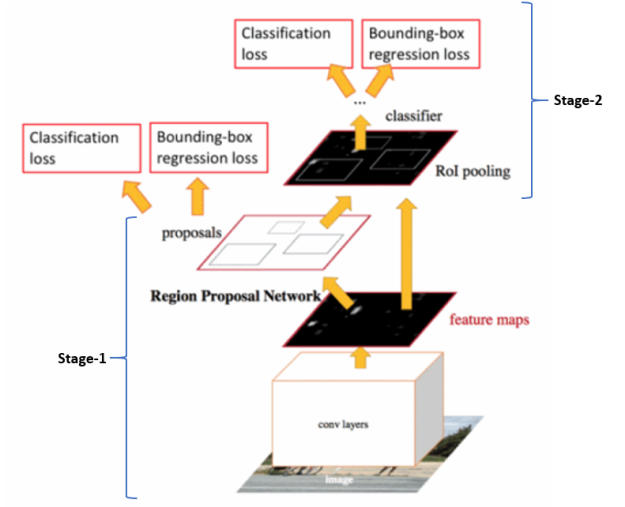

# Mask R-CNN

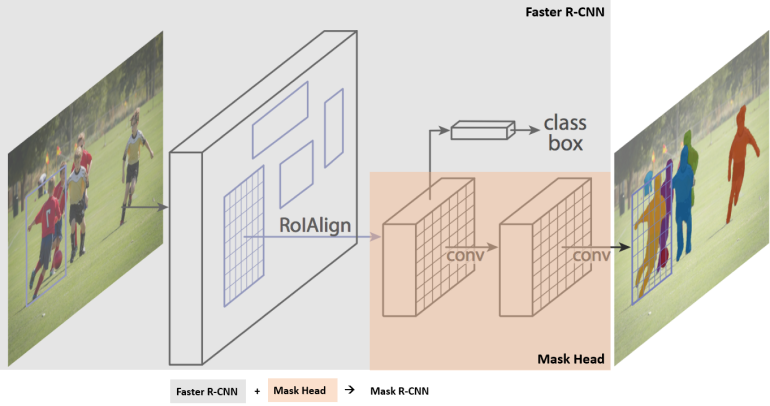

*Note*: **R**egion **o**f **I**nterest **Align**, or RoIAlign, is an operation for extracting a small feature map from each RoI in detection and segmentation based tasks. It removes the harsh quantization of RoI Pool, properly aligning the extracted features with the input.

# Download [dataset](https://www.cis.upenn.edu/~jshi/ped_html/)

In [1]:
import os
if os.path.isdir('PennFudanPed')==False:
    !wget https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip --no-check-certificate

--2025-02-01 00:19:30--  https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
Resolving www.cis.upenn.edu (www.cis.upenn.edu)... 158.130.69.163, 2607:f470:8:64:5ea5::d
Connecting to www.cis.upenn.edu (www.cis.upenn.edu)|158.130.69.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 53723336 (51M) [application/zip]
Saving to: ‘PennFudanPed.zip’

PennFudanPed.zip    100%[===================>]  51.23M  32.5MB/s    in 1.6s    

2025-02-01 00:19:32 (32.5 MB/s) - ‘PennFudanPed.zip’ saved [53723336/53723336]



In [2]:
if os.path.isdir('PennFudanPed')==False:
    !unzip PennFudanPed.zip

Archive:  PennFudanPed.zip
   creating: PennFudanPed/
  inflating: PennFudanPed/added-object-list.txt  
   creating: PennFudanPed/Annotation/
  inflating: PennFudanPed/Annotation/FudanPed00001.txt  
  inflating: PennFudanPed/Annotation/FudanPed00002.txt  
  inflating: PennFudanPed/Annotation/FudanPed00003.txt  
  inflating: PennFudanPed/Annotation/FudanPed00004.txt  
  inflating: PennFudanPed/Annotation/FudanPed00005.txt  
  inflating: PennFudanPed/Annotation/FudanPed00006.txt  
  inflating: PennFudanPed/Annotation/FudanPed00007.txt  
  inflating: PennFudanPed/Annotation/FudanPed00008.txt  
  inflating: PennFudanPed/Annotation/FudanPed00009.txt  
  inflating: PennFudanPed/Annotation/FudanPed00010.txt  
  inflating: PennFudanPed/Annotation/FudanPed00011.txt  
  inflating: PennFudanPed/Annotation/FudanPed00012.txt  
  inflating: PennFudanPed/Annotation/FudanPed00013.txt  
  inflating: PennFudanPed/Annotation/FudanPed00014.txt  
  inflating: PennFudanPed/Annotation/FudanPed00015.txt  
  i

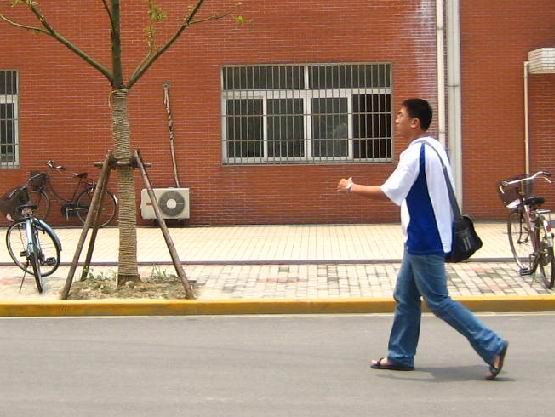

In [3]:
from PIL import Image
Image.open('PennFudanPed/PNGImages/FudanPed00020.png')

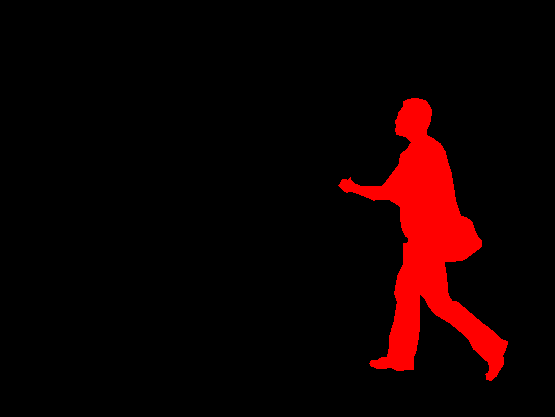

In [4]:
mask = Image.open('PennFudanPed/PedMasks/FudanPed00020_mask.png').convert("L")
#PIL Image.putpalette mostly work with P or L type

# each mask instance has a different color, from zero to N, where
# N is the number of instances. In order to make visualization easier,
# let's add a color palette to the mask.
mask.putpalette([
    0, 0, 0, # black background
    255, 0, 0, # index 1 is red
    255, 255, 0, # index 2 is yellow
    255, 153, 0, # index 3 is orange
])
mask

In [5]:
import numpy as np
import torch
import torch.utils.data


class PedestrianDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

    def __getitem__(self, idx):
        # load images ad masks
        img_path = os.path.join(self.root, "PNGImages", self.imgs[idx])
        mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])
        img = Image.open(img_path).convert("RGB")
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
        mask = Image.open(mask_path)

        mask = np.array(mask)
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]

        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:, None, None]

        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "masks": masks,
            "image_id": image_id,
            "area": area,
            "iscrowd": iscrowd
        }

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

As we want to fine-tune Mask-RCNN, we need to modify its pre-trained head with a new one. For Mask-RCNN, because it has an object-detecor (box_predictor) and a mask_predictor. So, we need to modify both of them to adapt to our dataset.

In [6]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

# version dependent: pretrained=True or weights='DEFAULT'
def build_model(num_classes):
    # load an instance segmentation model pre-trained on COCO

    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # Stop here if you are fine-tunning Faster-RCNN

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,
                                                       num_classes)

    return model

In [7]:
from torchvision.transforms import functional as F

# Transforms
class Compose:
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, target):
        for t in self.transforms:
            image, target = t(image, target)
        return image, target

class ToTensor:
    def __call__(self, image, target):
        image = F.to_tensor(image)
        return image, target

class RandomHorizontalFlip:
    def __init__(self, prob):
        self.prob = prob

    def __call__(self, image, target):
        if random.random() < self.prob:
            height, width = image.shape[-2:]
            image = image.flip(-1)
            bbox = target["boxes"]
            bbox[:, [0, 2]] = width - bbox[:, [2, 0]]
            target["boxes"] = bbox
            target["masks"] = target["masks"].flip(-1)
        return image, target

In [8]:
def get_transform(train):
    transforms = []
    transforms.append(ToTensor())
    if train:
        transforms.append(RandomHorizontalFlip(0.5))
    return Compose(transforms)

# Training Setup
def collate_fn(batch):
    return tuple(zip(*batch))

# Create datasets
dataset = PedestrianDataset('PennFudanPed', get_transform(train=True))
dataset_test = PedestrianDataset('PennFudanPed', get_transform(train=False))

# Split dataset
indices = torch.randperm(len(dataset)).tolist()
dataset = torch.utils.data.Subset(dataset, indices[:-50])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-50:])

# Create data loaders
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=2, shuffle=True,
    num_workers=2, collate_fn=collate_fn
)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False,
    num_workers=2, collate_fn=collate_fn
)

In [9]:
# Initialize model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
num_classes = 2
model = build_model(num_classes)
model.to(device)

# Optimizer and LR scheduler
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:01<00:00, 154MB/s]


In [10]:
!pip install -q pycocotools
!git clone https://github.com/pytorch/vision.git
%cd vision
!git checkout v0.15.2  # Match your TorchVision version
%cd references/detection
!cp coco_eval.py engine.py utils.py transforms.py coco_utils.py ../../../
%cd ../../../

Cloning into 'vision'...
remote: Enumerating objects: 592609, done.
remote: Counting objects: 100% (1300/1300), done.
remote: Compressing objects: 100% (267/267), done.
remote: Total 592609 (delta 1106), reused 1131 (delta 1027), pack-reused 591309 (from 2)
Receiving objects: 100% (592609/592609), 1.11 GiB | 27.66 MiB/s, done.
Resolving deltas: 100% (553806/553806), done.
/content/vision
Note: switching to 'v0.15.2'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by switching back to a branch.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -c with the switch command. Example:

  git switch -c <new-branch-name>

Or undo this operation with:

  git switch -

Turn off this advice by setting config variable advice.detachedHead to false

HEAD is now at fa99a5360f Remove temporary channel for python 

In [11]:
import random
from engine import train_one_epoch, evaluate
# Training Loop (Fixed Version)
num_epochs = 5

for epoch in range(num_epochs):
    # Train for one epoch using built-in engine
    train_one_epoch(
        model,
        optimizer,
        data_loader,
        device,
        epoch,
        print_freq=10
    )

    # Update learning rate
    lr_scheduler.step()

    # Evaluate on test set
    evaluate(model, data_loader_test, device=device)

/content/engine.py:30: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Epoch: [0]  [ 0/60]  eta: 0:04:55  lr: 0.000090  loss: 6.0918 (6.0918)  loss_classifier: 0.4204 (0.4204)  loss_box_reg: 0.3663 (0.3663)  loss_mask: 5.2963 (5.2963)  loss_objectness: 0.0040 (0.0040)  loss_rpn_box_reg: 0.0047 (0.0047)  time: 4.9171  data: 0.2908  max mem: 2537
Epoch: [0]  [10/60]  eta: 0:00:48  lr: 0.000936  loss: 2.3120 (3.2464)  loss_classifier: 0.3999 (0.3426)  loss_box_reg: 0.3183 (0.3416)  loss_mask: 1.2611 (2.5337)  loss_objectness: 0.0244 (0.0224)  loss_rpn_box_reg: 0.0047 (0.0060)  time: 0.9800  data: 0.0356  max mem: 2761
Epoch: [0]  [20/60]  eta: 0:00:31  lr: 0.001783  loss: 0.8736 (2.0224)  loss_classifier: 0.1795 (0.2422)  loss_box_reg: 0.2909 (0.2900)  loss_mask: 0.3581 (1.4663)  loss_objectness: 0.0153 (0.0178)  loss_rpn_box_reg: 0.0049 (0.0062)  time: 0.5733  data: 0.0094  max mem: 3497
Epoch: [0]  [30/60]  eta: 0:00:21  lr: 0.002629  loss: 0.5780 (1.5458)  loss_classifier: 0.0955 (0.1918)  loss_box_reg: 0.1958 (0.2610)  loss_mask: 0.2472 (1.0729)  loss_ob

#Save and Load model, weights

In [24]:
import os

weights_dir = os.path.abspath('maskrcnn_weights')
if not os.path.isdir(weights_dir):
    os.makedirs(weights_dir, exist_ok=True)
    print(f"Created weights directory: {weights_dir}")
else:
    print(f"Weights directory exists: {weights_dir}")

Weights directory exists: /content/maskrcnn_weights


In [25]:
model_full_path = os.path.join(weights_dir, 'mask-rcnn-pedestrian2.pt')
torch.save(model, model_full_path)
print(f"Full model saved to: {model_full_path}")

Full model saved to: /content/maskrcnn_weights/mask-rcnn-pedestrian2.pt


In [26]:
weights_path = os.path.join(weights_dir, 'mask-rcnn-pedestrian_weights2.pt')
torch.save(model.state_dict(), weights_path)
print(f"Model weights saved to: {weights_path}")

Model weights saved to: /content/maskrcnn_weights/mask-rcnn-pedestrian_weights2.pt


In [27]:
try:
    # Verify file exists first
    if not os.path.exists(weights_path):
        raise FileNotFoundError(f"Weights file not found at: {weights_path}")

    # Load with modern parameters
    loaded_state_dict = torch.load(weights_path, weights_only=True, map_location=device)
    model.load_state_dict(loaded_state_dict)
    print("Weights loaded successfully!")

except Exception as e:
    print(f"Loading failed: {str(e)}")
    print("Current directory structure:")
    !ls -l {weights_dir}

Weights loaded successfully!


# Inference

In [28]:
# set to evaluation mode
model.eval()
CLASS_NAMES = ['__background__', 'pedestrian']
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [29]:
%matplotlib inline
import matplotlib.pyplot as plt
import torchvision.transforms as T
import cv2
import random
import warnings
warnings.filterwarnings('ignore')

def get_coloured_mask(mask):
    """
    random_colour_masks
      parameters:
        - image - predicted masks
      method:
        - the masks of each predicted object is given random colour for visualization
    """
    colours = [[0, 255, 0],[0, 0, 255],[255, 0, 0],[0, 255, 255],[255, 255, 0],[255, 0, 255],[80, 70, 180],[250, 80, 190],[245, 145, 50],[70, 150, 250],[50, 190, 190]]
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    r[mask == 1], g[mask == 1], b[mask == 1] = colours[random.randrange(0,10)]
    coloured_mask = np.stack([r, g, b], axis=2)
    return coloured_mask

def get_prediction(img_path, confidence):
    """
    get_prediction
      parameters:
        - img_path - path of the input image
        - confidence - threshold to keep the prediction or not
      method:
        - Image is obtained from the image path
        - the image is converted to image tensor using PyTorch's Transforms
        - image is passed through the model to get the predictions
        - masks, classes and bounding boxes are obtained from the model and soft masks are made binary(0 or 1) on masks
          ie: eg. segment of cat is made 1 and rest of the image is made 0

    """
    img = Image.open(img_path)
    transform = T.Compose([T.ToTensor()])
    img = transform(img)

    img = img.to(device)
    pred = model([img])
    pred_score = list(pred[0]['scores'].detach().cpu().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x>confidence][-1]
    masks = (pred[0]['masks']>0.5).squeeze().detach().cpu().numpy()
    # print(pred[0]['labels'].numpy().max())
    pred_class = [CLASS_NAMES[i] for i in list(pred[0]['labels'].cpu().numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().cpu().numpy())]
    masks = masks[:pred_t+1]
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]
    return masks, pred_boxes, pred_class

def segment_instance(img_path, confidence=0.5, rect_th=2, text_size=1, text_th=2):
    """
    segment_instance
      parameters:
        - img_path - path to input image
        - confidence- confidence to keep the prediction or not
        - rect_th - rect thickness
        - text_size
        - text_th - text thickness
      method:
        - prediction is obtained by get_prediction
        - each mask is given random color
        - each mask is added to the image in the ration 1:0.8 with opencv
        - final output is displayed
    """
    masks, boxes, pred_cls = get_prediction(img_path, confidence)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for i in range(len(masks)):
      rgb_mask = get_coloured_mask(masks[i])
      img = cv2.addWeighted(img, 1, rgb_mask, 0.5, 0)

      #cv2.rectangle and cv2.putText version dependent
      pt1 = tuple([int(j) for j in boxes[i][0]])
      pt2 = tuple([int(j) for j in boxes[i][1]])
      cv2.rectangle(img, pt1, pt2,color=(0, 255, 0), thickness=rect_th)
      cv2.putText(img,pred_cls[i], pt1, cv2.FONT_HERSHEY_SIMPLEX, text_size, (0,255,0),thickness=text_th)
    plt.figure(figsize=(20,30))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

2025-02-01 00:39:29 URL:https://storage.needpix.com/rsynced_images/pedestrian-zone-456909_1280.jpg [409534/409534] -> "pedestrian.jpg" [1]


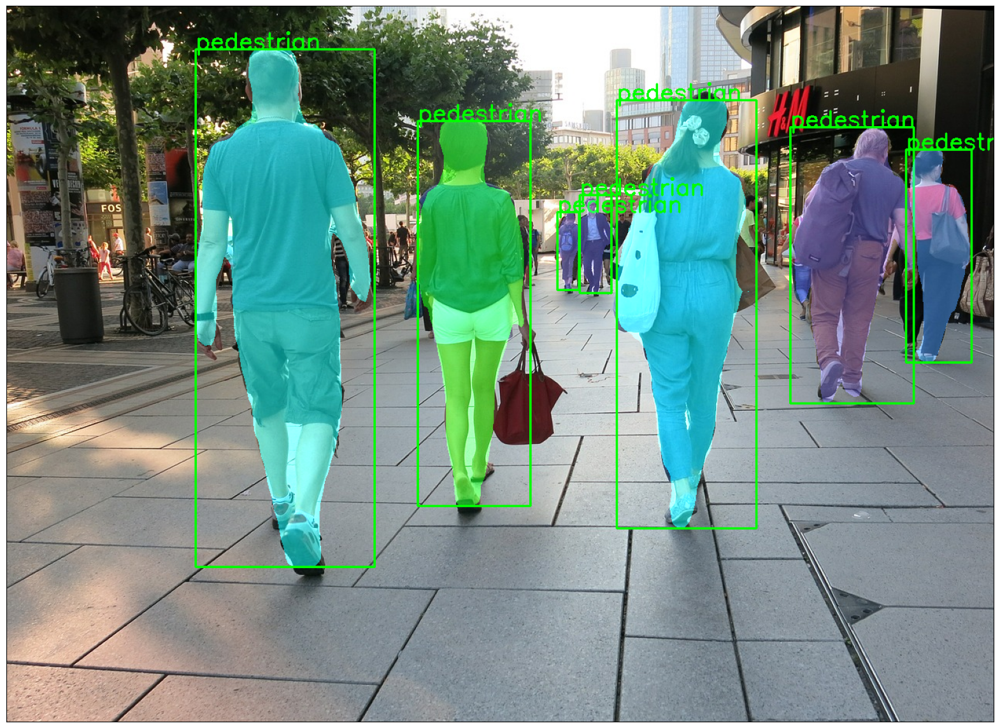

In [30]:
!wget -nv "https://storage.needpix.com/rsynced_images/pedestrian-zone-456909_1280.jpg" --no-check-certificate -O pedestrian.jpg
segment_instance('./pedestrian.jpg', confidence=0.7)

--2025-02-01 00:40:08--  https://upload.wikimedia.org/wikipedia/commons/9/97/CrossWalk_%285465840138%29.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3274185 (3.1M) [image/jpeg]
Saving to: ‘pedestrian2.jpg’

pedestrian2.jpg     100%[===================>]   3.12M  17.9MB/s    in 0.2s    

2025-02-01 00:40:09 (17.9 MB/s) - ‘pedestrian2.jpg’ saved [3274185/3274185]



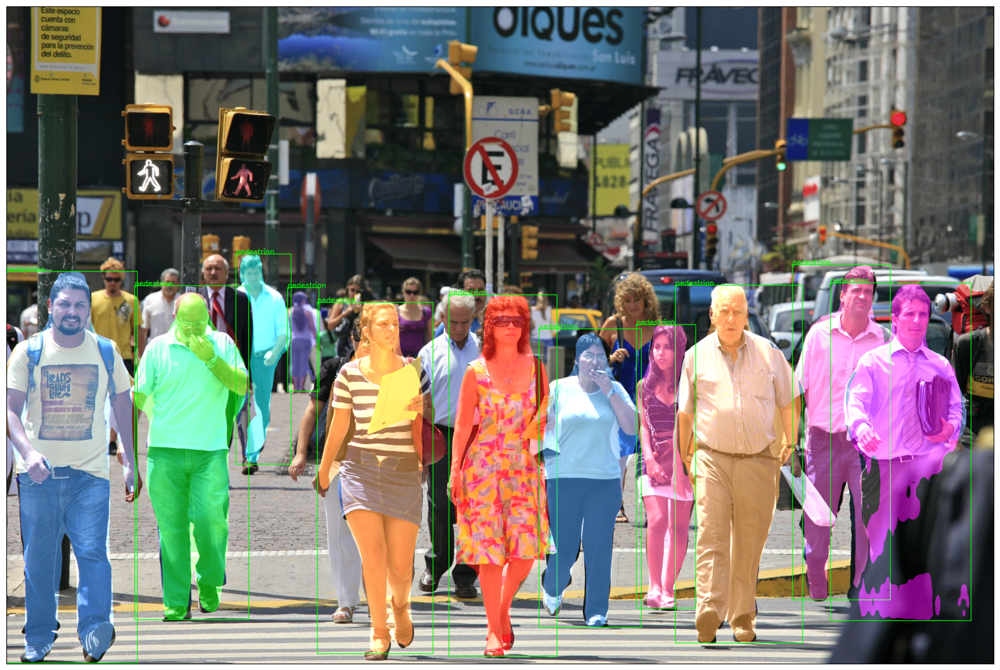

In [31]:
!wget "https://upload.wikimedia.org/wikipedia/commons/9/97/CrossWalk_%285465840138%29.jpg" --no-check-certificate -O pedestrian2.jpg

segment_instance('./pedestrian2.jpg', confidence=0.7)

2025-02-01 00:40:50 URL:https://img.freepik.com/premium-vector/school-kids-with-backpack-walking-crossing-road-near-pedestrian-traffic-light-zebra-cross_535862-475.jpg?w=2000 [171586/171586] -> "pedestrian3.jpg" [1]


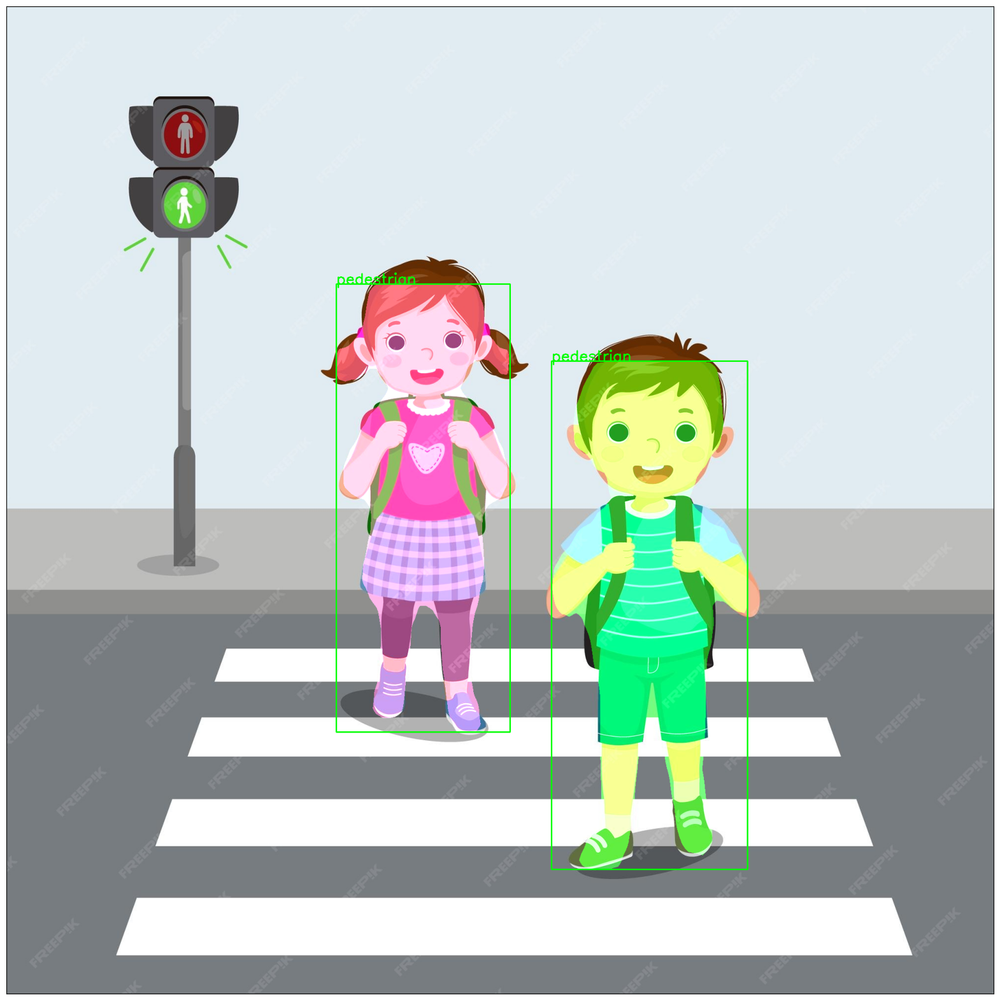

In [32]:
!wget -nv https://img.freepik.com/premium-vector/school-kids-with-backpack-walking-crossing-road-near-pedestrian-traffic-light-zebra-cross_535862-475.jpg?w=2000 --no-check-certificate -O pedestrian3.jpg
segment_instance('./pedestrian3.jpg', confidence=0.7)

## Test with my Images

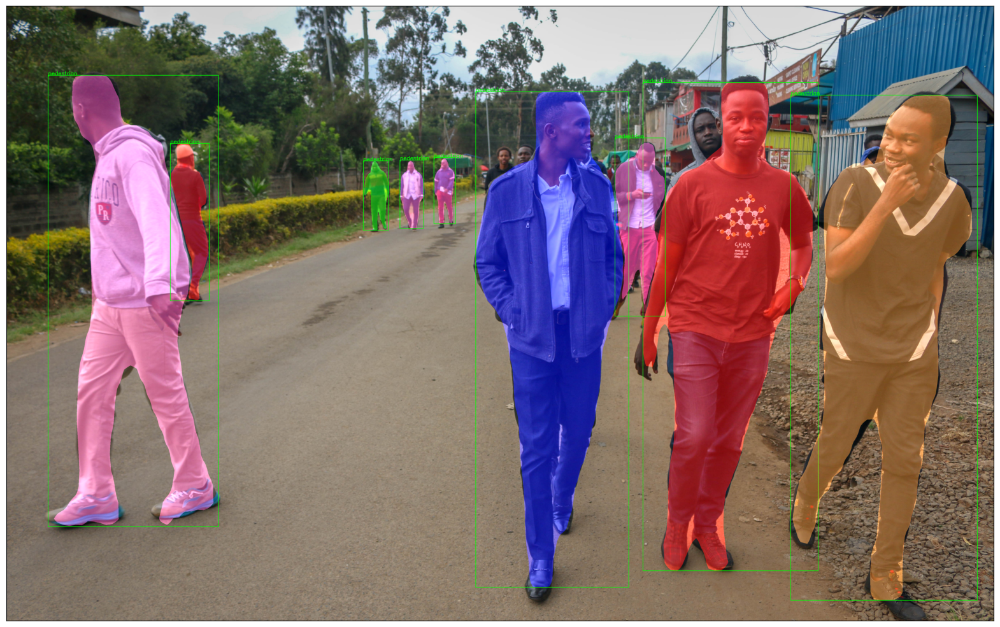

In [33]:
image_path = "/content/WalkingImage.jpg"
segment_instance(image_path, confidence=0.7)